# Validation: Heldout Data Example

This notebook:

* loads a library defined model. 
* loads the data according to the data preprocessor class.
* holds-out the final few days of the data, and see's if they can be predicted. 

The way I propose doing this is holding out the confirmed observations for the final three days of the day for every country, and then plotting it for validation. This effectively changes the output model. 

Compared to the above changes, lets make the following changes:

* Switch the prior to the ICL prior used. 
* Refine the country list
* switch to binary interventions
* use active rather than confirmed cases
* transform into log space

In [285]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [330]:
### Initial imports
import logging
import numpy as np
import pandas as pd
import pymc3 as pm
import theano.tensor as T
import matplotlib.pyplot as plt

logging.basicConfig(level=logging.INFO)
log = logging.getLogger(__name__)

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

from epimodel.pymc3_models.utils import geom_convolution
from epimodel.pymc3_models import cm_effect
from epimodel.pymc3_models.cm_effect.datapreprocessor import DataPreprocessorV2
from epimodel.pymc3_models.cm_effect.models import produce_CIs


%matplotlib inline

INFO:epimodel.regions:Name index has 7 potential conflicts: ['american samoa', 'georgia', 'guam', 'northern mariana islands', 'puerto rico', 'united states minor outlying islands', 'virgin islands (u.s.)']
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:
Countermeasures: Epidemic Forecasting              min   ... mean  ... max   ... unique
 1 Mask wearing over 70%                      0.000 ... 0.062 ... 1.000 ... [0. 1.]
 2 Business suspended - some                  0.000 ... 0.272 ... 1.000 ... [0. 1.]
 3 Business suspended - many                  0.000 ... 0.197 ... 1.000 ... [0. 1.]
 4 Healthcare specialisation                  0.000 ... 0.056 ... 1.000 ... [0. 1.]
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:
Countermeasures: OxCGRT           min   ... mean  ... max   ... unique
 1 Symptomatic Testing                        0.000 ... 0.150 ... 1.000 ... [0. 1.]
 2 Public Testing                             0.000 ... 0.383 ... 1.000 ... [0. 1.]
 3 Limited Contact Tr

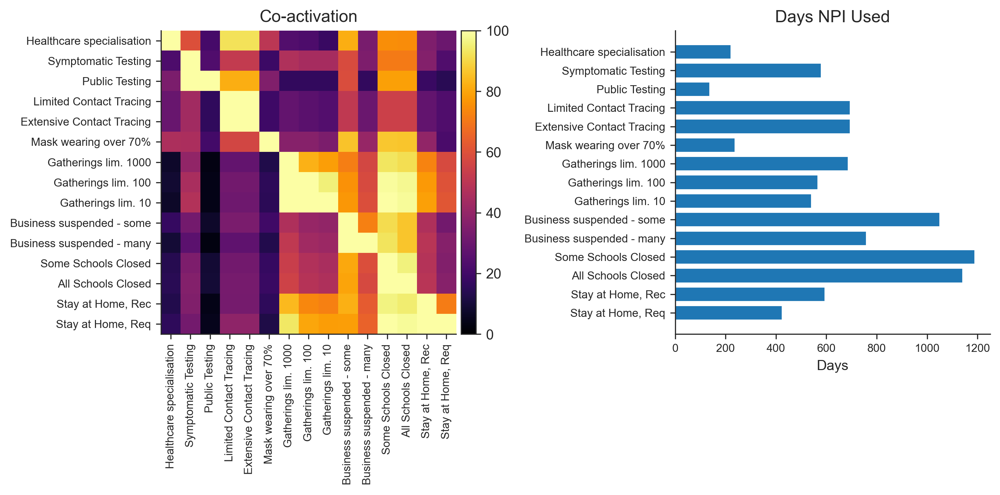

In [373]:
# name, epidemicforecasting.org code, OxCGRT code
region_info = [
    ("Andorra", "AD", "AND"),
    ("Austria", "AT",  "AUT"),
    ("Bosnia and Herzegovina", "BA", "BIH"),
    ("Belgium", "BE", "BEL"),
    ("Bulgaria",  "BG", "BGR"),
    ("Switzerland", "CH", "CHE"),
    ("Czech Republic", "CZ", "CZE"),
    ("Germany", "DE", "DEU"),
    ("Denmark", "DK", "DNK"),
    ("Estonia","EE", "EST"),
    ("Spain", "ES", "ESP"),
    ("Finland", "FI", "FIN"),
    ("France", "FR", "FRA"),
    ("United Kingdom", "GB", "GBR"),
    ("Greece", "GR", "GRC"),
    ("Croatia", "HR", "HRV"),
    ("Hungary", "HU", "HUN"),
    ("Ireland", "IE", "IRL"),
    ("Israel", "IL", "ISR"),
    ("Iceland", "IS", "ISL"),
    ("Italy", "IT", "ITA"),
    ("South Korea", "KR", "KOR"),
    ("Morocco", "MA", "MAR"),
    ("Mexico","MX", "MEX"),
    #("Malaysia", "MY", "MYS"),
    ("Netherlands", "NL", "NLD"),
    ("Poland","PL", "POL"),
    ("Romania","RO", "ROU"),
    ("Serbia", "RS", "SRB"),
    ("Sweden", "SE", "SWE"),
    ("Singapore", "SG", "SGP"),
    ("Slovenia", "SI", "SVN"),
    ("Slovakia", "SK", "SVK"),
    ("South Africa", "ZA",  "ZAF")
]

# OxCGRT
oxcgrt_cm_cols = ["C1_School closing", "C1_Flag", "C4_Restrictions on gatherings", "C4_Flag", "C6_Stay at home requirements",
              "C6_Flag", "H2_Testing policy", "H3_Contact tracing"]

oxcgrt_filter = [
    ("Symptomatic Testing", [(6, [2, 3])]),
    ("Public Testing", [(6, [3])]),
    ("Limited Contact Tracing", [(7, [2, 3])]),
    ("Extensive Contact Tracing", [(7, [2, 3])]),
    ("Gatherings lim. 1000", [(2, [2, 3, 4]), (3, [1])]),
    ("Gatherings lim. 100", [(2, [3, 4]), (3, [1])] ),
    ("Gatherings lim. 10", [(2, [4]), (3, [1])] ),
    ("Some Schools Closed", [(0, [3, 2]), (1, [1])]),
    ("All Schools Closed", [(0, [3]), (1, [1])] ),
    ("Stay at Home, Rec", [(4, [1, 2, 3]), (5, [1])] ),
    ("Stay at Home, Req", [(4, [2, 3]), (5, [1])] ),
]

epifor_features = [
 'Mask wearing over 70%',
 'Business suspended - some',
 'Business suspended - many',
 'Healthcare specialisation'
]

final_features_ordered = [
    "Healthcare specialisation",
    "Symptomatic Testing",
    "Public Testing",
    "Limited Contact Tracing",
    "Extensive Contact Tracing",
    "Mask wearing over 70%",
    "Gatherings lim. 1000", 
    "Gatherings lim. 100",
    "Gatherings lim. 10", 
    "Business suspended - some",
    "Business suspended - many",
    "Some Schools Closed",
    "All Schools Closed", 
    "Stay at Home, Rec", 
    "Stay at Home, Req",
]

dp = DataPreprocessorV2(min_num_confirmed_mask=100, min_num_active_mask=100, end_date="2020-04-20")
data = dp.preprocess_data("../../data", region_info, oxcgrt_filter, oxcgrt_cm_cols, epifor_features, final_features_ordered)

def mask_region_start(d, region, start):
    i = d.Rs.index(region)
    d.Active.mask[i,start:] = True
    d.Confirmed.mask[i,start:] = True
    d.Deaths.mask[i,start:] = True
    d.NewDeaths.mask[i,start:] = True

def mask_region(d, region):
    i = d.Rs.index(region)
    confirm_start = list(d.Confirmed.mask[i,:]).index(False)
    holdout_cutoff = confirm_start + 7
    mask_region_start(d, region, holdout_cutoff)
    
mask_region(data, 'DE')
mask_region(data, 'ES')
mask_region(data, 'GB')
mask_region(data, 'GR')

In [382]:
with cm_effect.models.CMConfirmedAndDeaths(data) as model:
    model.build()

/Users/jsalvatier/Library/Caches/pypoetry/virtualenvs/epimodel-Y5DpXmSQ-py3.8/lib/python3.8/site-packages/pymc3/model.py:1430: ImputationWarning: Data in ObservedDeaths contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)


In [383]:
with model:
    model.trace = pm.load_trace(directory="combined_standard")
    start=model.trace.point(-1)
    start.pop('ObservedConfirmed_missing')
    start.pop('ObservedDeaths_missing')

# Death only

In [384]:
with model:
    model.trace = pm.sample(1000, chains=2, cores=2, init='adapt_diag', start=start)

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
INFO:pymc3:Initializing NUTS using adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
INFO:pymc3:Multiprocess sampling (2 chains in 2 jobs)
NUTS: [ObservedDeaths_missing, InitialSize, Growth, DelayCAlpha, DelayCMean, ReportRateLog, ReportRateStd, ReportRateMean, CM_Alpha, RegionGrowthRate, HyperGrowthRateVar, HyperGrowthRateMean, DeathsNoise]
INFO:pymc3:NUTS: [ObservedDeaths_missing, InitialSize, Growth, DelayCAlpha, DelayCMean, ReportRateLog, ReportRateStd, ReportRateMean, CM_Alpha, RegionGrowthRate, HyperGrowthRateVar, HyperGrowthRateMean, DeathsNoise]
Sampling 2 chains, 0 divergences:   2%|▏         | 52/3000 [00:14<14:08,  3.47draws/s]


ValueError: Not enough samples to build a trace.

In [ ]:

model.plot_region_predictions()

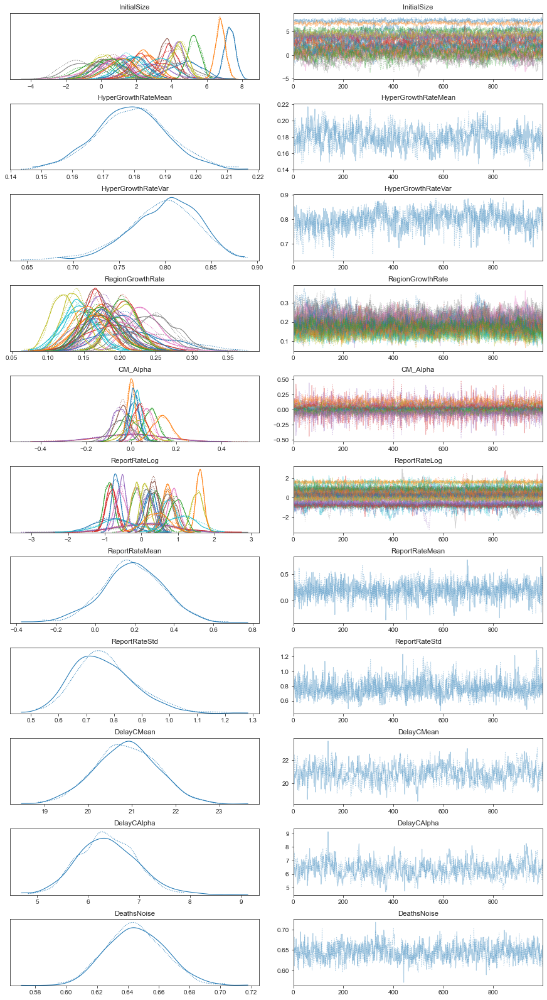

In [379]:
v =[
    'InitialSize',
    'HyperGrowthRateMean',
    'HyperGrowthRateVar',
    'RegionGrowthRate',
    'CM_Alpha',
    'ReportRateLog',
    'ReportRateMean',
    'ReportRateStd',
    'DelayCMean','DelayCAlpha',
    'DeathsNoise',
]

pm.traceplot(model.trace, v);

INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/jsalvatier/workspace/cov19/epimodel/notebooks/heldout_validation/out


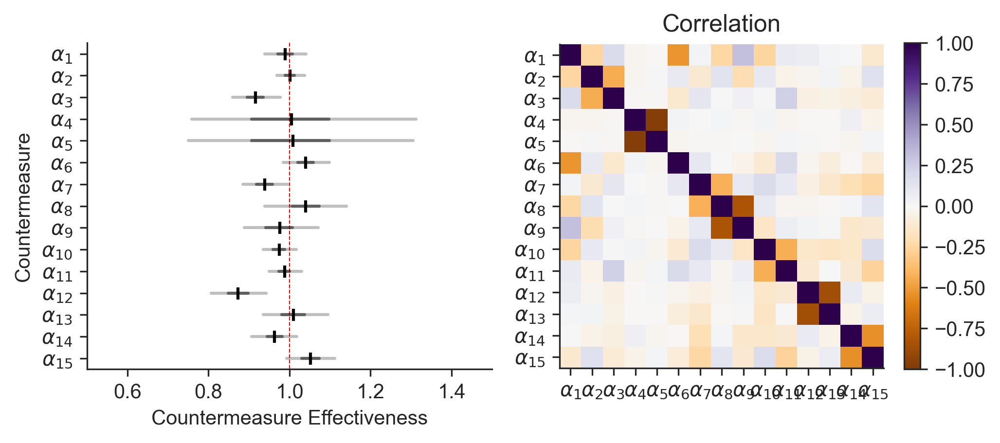

In [380]:

model.plot_effect()

In [386]:

pm.save_trace(model.trace[200:], directory="combined_standard", overwrite=True)

'combined_standard'

In [362]:
with cm_effect.models.CMConfirmedAndDeaths(data) as model2:
    model2.build()
    model2.trace = pm.load_trace(directory="combined_standard")

/Users/jsalvatier/Library/Caches/pypoetry/virtualenvs/epimodel-Y5DpXmSQ-py3.8/lib/python3.8/site-packages/pymc3/model.py:1430: ImputationWarning: Data in ObservedConfirmed contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
/Users/jsalvatier/Library/Caches/pypoetry/virtualenvs/epimodel-Y5DpXmSQ-py3.8/lib/python3.8/site-packages/pymc3/model.py:1430: ImputationWarning: Data in ObservedDeaths contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)


INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/jsalvatier/workspace/cov19/epimodel/notebooks/heldout_validation/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/jsalvatier/workspace/cov19/epimodel/notebooks/heldout_validation/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/jsalvatier/workspace/cov19/epimodel/notebooks/heldout_validation/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/jsalvatier/workspace/cov19/epimodel/notebooks/heldout_validation/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/jsalvatier/workspace/cov19/epimodel/notebooks/heldout_validation/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/jsalvatier/workspace/cov19/epimodel/notebooks/heldout_validation/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/jsalvatier/workspace/cov19/epimodel/notebooks/heldout_validation/out


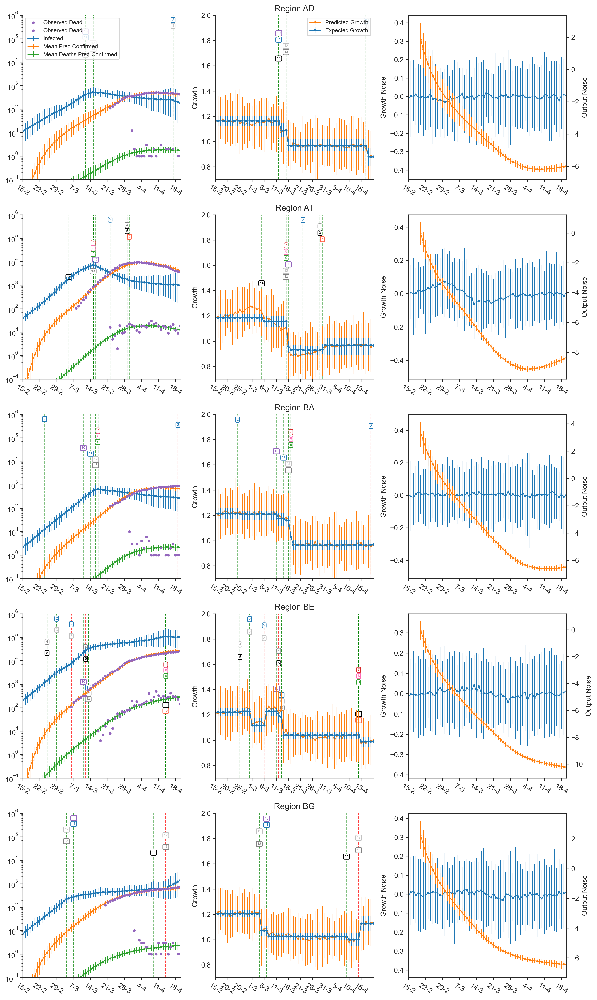

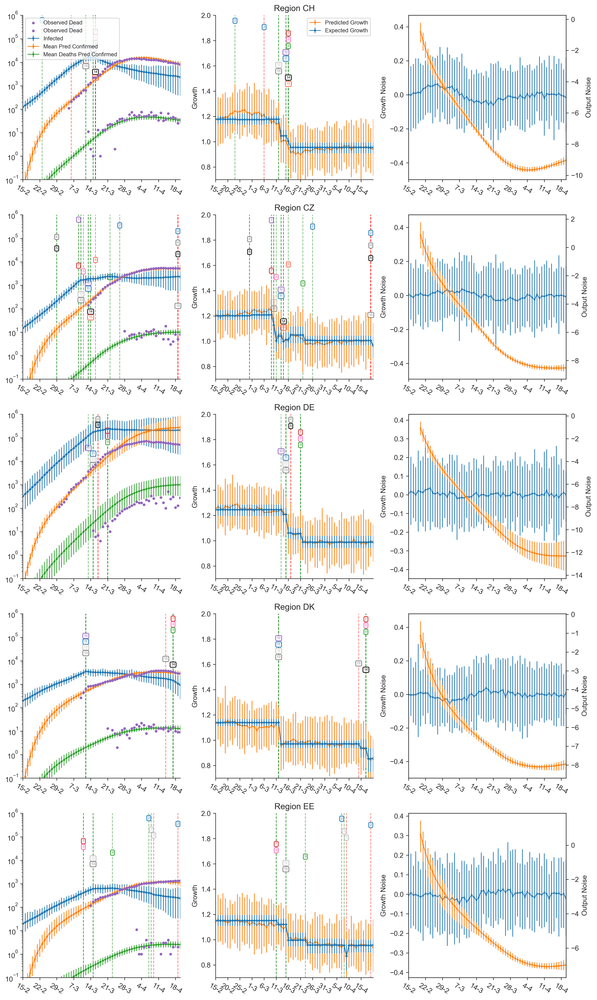

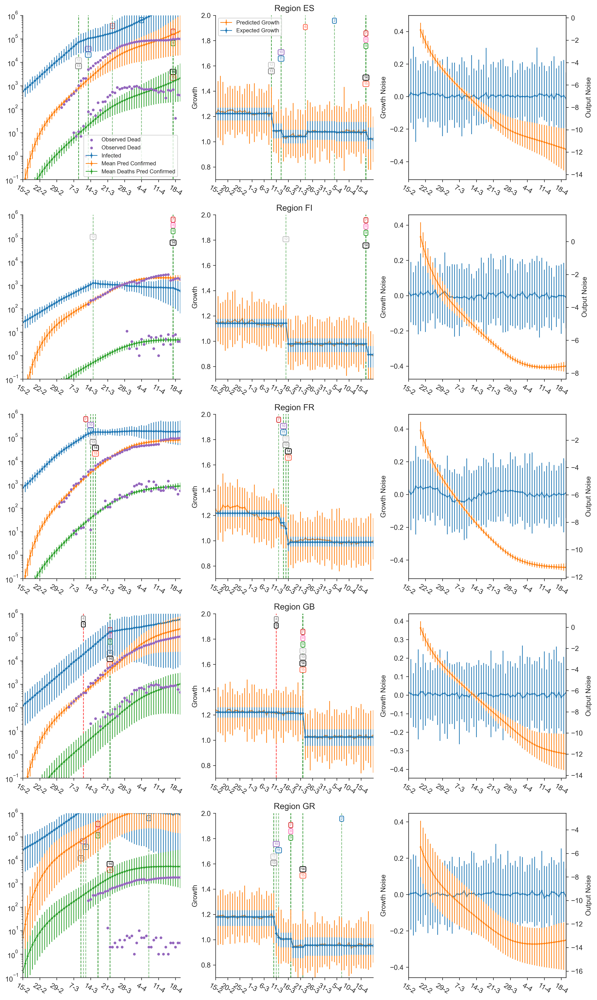

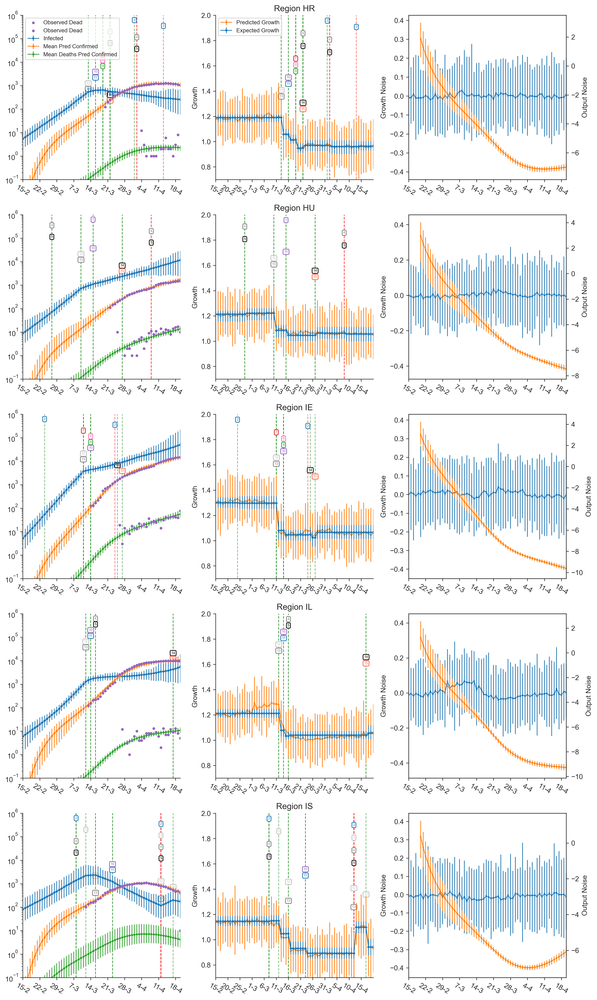

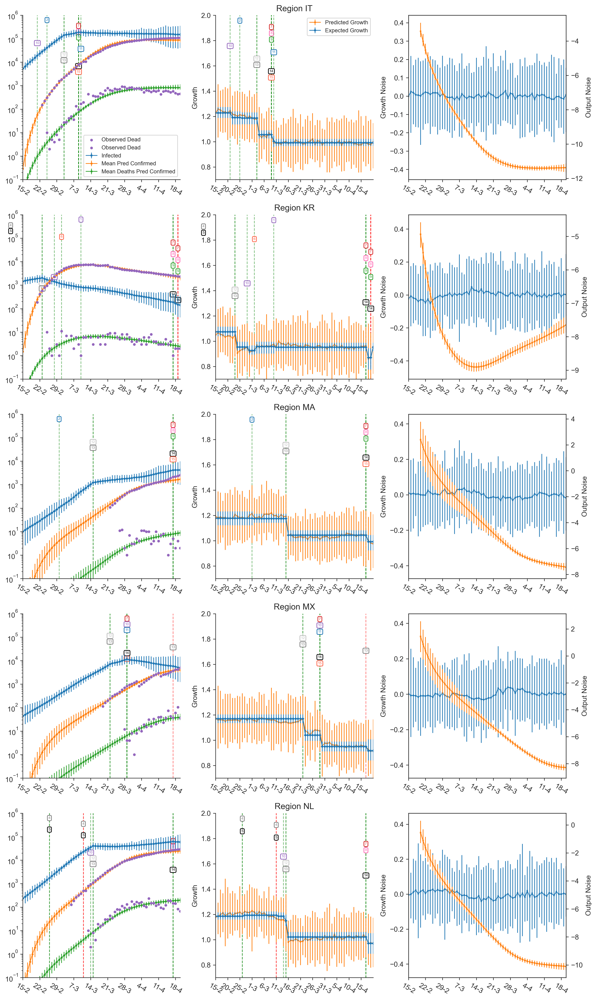

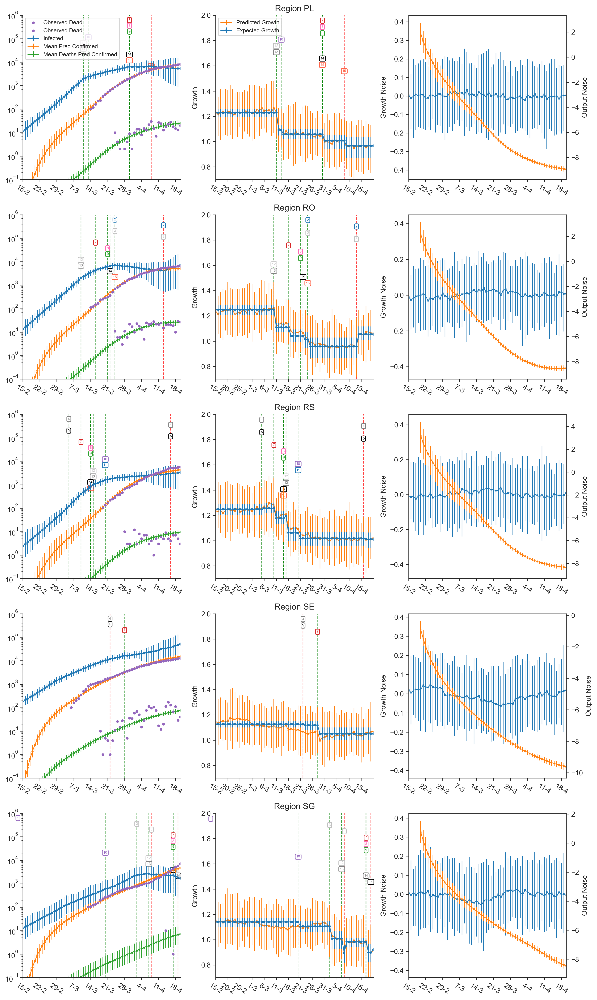

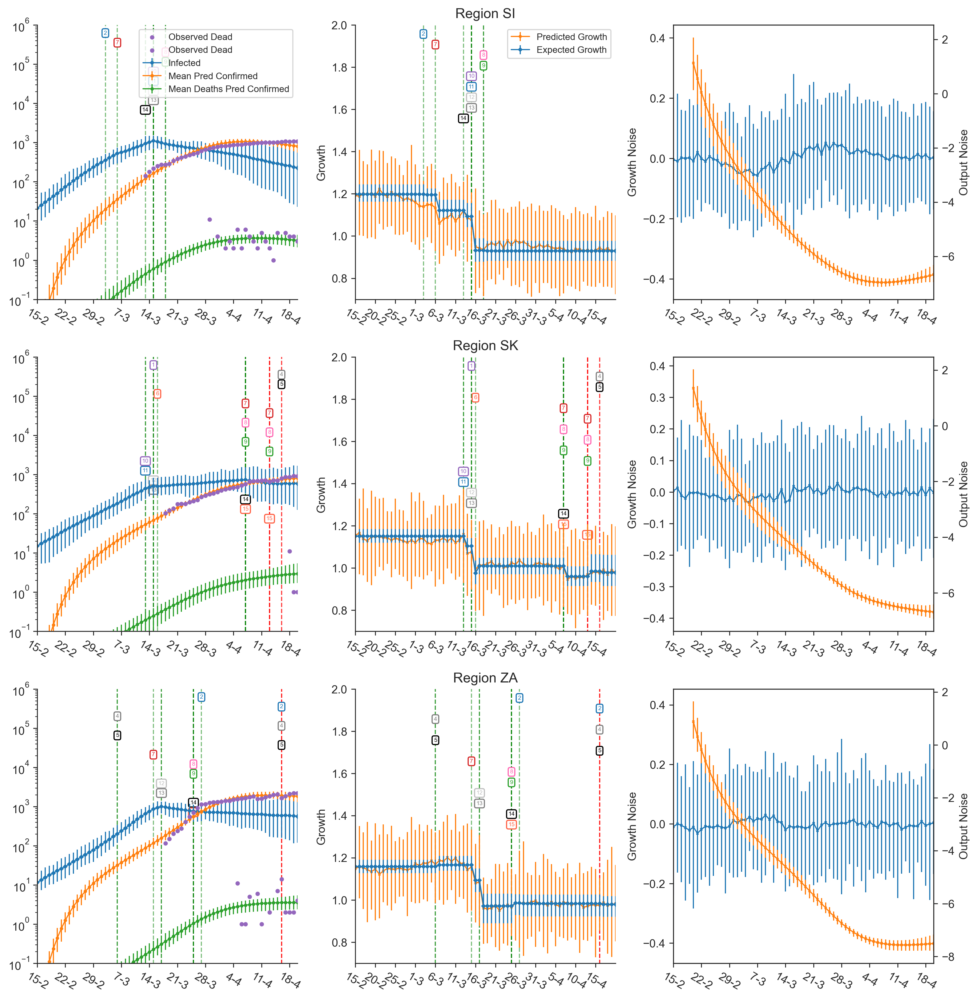

In [363]:
model2.plot_region_predictions()

In [12]:
start2 = model.trace.point(-1)

In [13]:
def norm(x): 
    s = T.sum(x)
    return x / s

DelayDDist = pm.NegativeBinomial.dist(mu=23.5, alpha=8)

nDelayD = 60
xD = np.arange( nDelayD)
DeathDelayProb = norm(T.exp(DelayDDist.logp(xD)))


(0.0, 0.1)

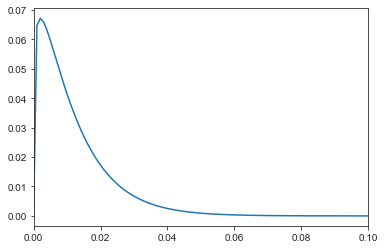

In [14]:
n=100
DelayDDist = pm.Beta.dist(.002*n+1,n+1 )

x = np.linspace(0,1,1000)
y = norm(T.exp(DelayDDist.logp(x))).tag.test_value
plt.plot(x, y)
plt.xlim(0,.1)


In [15]:

with cm_effect.models.CMConfirmedAndDeaths(data) as model2:
    model2.build()
    

/Users/jsalvatier/Library/Caches/pypoetry/virtualenvs/epimodel-Y5DpXmSQ-py3.8/lib/python3.8/site-packages/pymc3/model.py:1430: ImputationWarning: Data in ObservedConfirmed contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
/Users/jsalvatier/Library/Caches/pypoetry/virtualenvs/epimodel-Y5DpXmSQ-py3.8/lib/python3.8/site-packages/pymc3/model.py:1430: ImputationWarning: Data in ObservedDeaths contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)


In [16]:
with model2:
    model2.trace = pm.sample(500, chains=2, cores=2, init='adapt_diag', start=start)

NameError: name 'start' is not defined

In [ ]:
model2.OR_indxs = range(len(model.d.Rs))
model2.ORs = model.d.Rs
model2.plot_region_predictions()

In [ ]:
model2.vars

In [ ]:
v =[
    'InitialSize',
    'ConfirmationNoise',
    'DeathNoise',
    'HyperGrowthRateMean',
    'HyperGrowthRateVar',
    'RegionGrowthRate',
    'CM_Alpha',
    'ReportRate',
    
]
pm.traceplot(model2.trace, v)

In [ ]:
model2.trace['diverging'].nonzero()

In [ ]:
model2.trace.point(-1)

In [ ]:
pm.traceplot(model2.trace, ['CM_Alpha_log__'])

In [ ]:
import arviz as az 
az.plot_trace(model2.trace['CM_Alpha_log__'][None, :,:])

In [ ]:
model2.trace['CM_Alpha_log__'].shape

In [ ]:
np.cumsum([.1,.2,.3])

In [52]:
#goodtrace = model.trace
#goodmodel = model

In [296]:
import pickle
start = end
with open("combined_model_start.pickle", "wb") as file: 
    pickle.dump(start, file)

In [327]:
r, d = np.where((data.ActiveCMs[:,6,:-1]==0) & (data.ActiveCMs[:,6,1:]==1))

In [328]:
r.shape

(20,)

In [351]:
model.d.Ds[37]

Timestamp('2020-03-18 00:00:00+0000', tz='UTC', freq='D')

In [385]:
model.trace[200:]

<MultiTrace: 2 chains, 800 iterations, 26 variables>